In [1]:
!pip install -U ultralytics[obb]


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 48.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.0/950.0 kB 33.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [2]:
!pip install ultralytics


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# Path to ZIP file in Drive
zip_path = "/content/License Plates.v3-original-license-plates.yolov8-obb.zip"

# Extract location
extract_dir = "/content/dataset"

# Create folder if it doesn't exist
os.makedirs(extract_dir, exist_ok=True)

# Extract ZIP
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("Dataset extracted successfully!")


FileNotFoundError: [Errno 2] No such file or directory: '/content/License-Plates.v3-original-license-plates.yolov8-obb.zip'

In [ ]:
# Display the data.yaml content
!cat /content/dataset/data.yaml

path: ../datasets/roboflow

train: train/images
val: valid/images
test: test/images

names: 
  0: license-plate
  1: vehicle

In [ ]:
# Update the data.yaml file with the correct path
yaml_content = """
path: /content/dataset
train: train/images
val: valid/images
test: test/images

names:
  0: license-plate
  1: vehicle
"""

# Write the corrected configuration back to data.yaml
with open("/content/dataset/data.yaml", "w") as file:
    file.write(yaml_content)

# Display the updated content
!cat /content/dataset/data.yaml



path: /content/dataset
train: train/images
val: valid/images
test: test/images

names:
  0: license-plate
  1: vehicle


## Train the model

In [ ]:
from ultralytics import YOLO

# Load YOLOv8 OBB model
model = YOLO("yolov8n-obb.pt")  # Choose model size: n, s, m, l, x

# Train the model
model.train(
    data="/content/dataset/data.yaml",    # Correct dataset config path
    epochs=100,                           # Training epochs
    imgsz=640,                            # Image size
    batch=16,                             # Batch size
    name="license_plate_obb",             # Model name
    project="/content/drive/MyDrive/Yolo_OBB_Model"  # Save model to Drive
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.26M/6.26M [00:00<00:00, 102MB/s]


Ultralytics 8.3.97 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=obb, mode=train, model=yolov8n-obb.pt, data=/content/dataset/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Yolo_OBB_Model, name=license_plate_obb, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fals

100%|██████████| 755k/755k [00:00<00:00, 20.5MB/s]


Overriding model.yaml nc=15 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 89.8MB/s]


AMP: checks passed ✅


train: Scanning /content/dataset/train/labels... 245 images, 0 backgrounds, 0 corrupt: 100%|██████████| 245/245 [00:00<00:00, 1901.21it/s]

train: New cache created: /content/dataset/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/dataset/valid/labels... 70 images, 0 backgrounds, 0 corrupt: 100%|██████████| 70/70 [00:00<00:00, 1373.03it/s]

val: New cache created: /content/dataset/valid/labels.cache


Plotting labels to /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 63 weight(decay=0.0), 73 weight(decay=0.0005), 72 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.44G      1.941      2.918        3.2         41        640: 100%|██████████| 16/16 [00:10<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all         70        218      0.458      0.499      0.467      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.77G       1.51      1.949      2.804         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.19it/s]

                   all         70        218      0.536      0.562      0.472      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.79G      1.441      1.635       2.71         22        640: 100%|██████████| 16/16 [00:05<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.63it/s]

                   all         70        218      0.768      0.575      0.607      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.81G      1.354       1.47      2.701         41        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.81it/s]

                   all         70        218      0.858      0.579       0.67      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.84G       1.36      1.401      2.657         31        640: 100%|██████████| 16/16 [00:07<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.72it/s]

                   all         70        218      0.828      0.586      0.682       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.86G      1.318      1.278      2.687         14        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.62it/s]

                   all         70        218      0.834      0.606      0.722      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.87G      1.209      1.172      2.455         31        640: 100%|██████████| 16/16 [00:05<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]

                   all         70        218      0.858      0.646      0.756      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.89G      1.183      1.122      2.478         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.57it/s]

                   all         70        218      0.845      0.657      0.764       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.91G      1.199      1.107      2.517         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]

                   all         70        218      0.861      0.667      0.791      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.93G      1.165      1.055      2.461         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.12it/s]

                   all         70        218      0.868      0.662      0.773      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.94G      1.196      1.123      2.508         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]

                   all         70        218       0.87      0.691      0.788      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.96G      1.143      1.019      2.397         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.01it/s]

                   all         70        218      0.869      0.678      0.803      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.98G       1.12     0.9942      2.368         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.52it/s]

                   all         70        218      0.864      0.679      0.806      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         4G      1.069     0.9623      2.344         35        640: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.45it/s]

                   all         70        218      0.862      0.734       0.82      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.01G      1.027     0.9157      2.288         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.79it/s]

                   all         70        218      0.875      0.716      0.823      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.03G      1.072     0.9895      2.373         22        640: 100%|██████████| 16/16 [00:05<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.02it/s]

                   all         70        218      0.922      0.711      0.827      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.05G      1.048     0.9564      2.311         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.93it/s]

                   all         70        218      0.862      0.718      0.824       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.07G     0.9665      0.897      2.246         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.18it/s]

                   all         70        218      0.856      0.707      0.815      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.08G     0.9863     0.8861      2.272         48        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.61it/s]

                   all         70        218      0.875      0.725      0.831      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       4.1G     0.9987     0.8868      2.292         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.37it/s]

                   all         70        218       0.84      0.721      0.825      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.12G      1.013     0.8805      2.308         28        640: 100%|██████████| 16/16 [00:05<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.12it/s]

                   all         70        218      0.871      0.756      0.824      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.14G     0.9746     0.8698      2.222         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]

                   all         70        218      0.823      0.779      0.838      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.15G      1.013     0.8752      2.288         39        640: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.17it/s]

                   all         70        218      0.831      0.754      0.827       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.17G     0.9321     0.8179      2.238         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.33it/s]

                   all         70        218      0.826       0.78      0.839      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.19G      1.005     0.8599      2.341         64        640: 100%|██████████| 16/16 [00:05<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]

                   all         70        218      0.901      0.698      0.836      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.21G     0.9054     0.7912      2.221         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.32it/s]

                   all         70        218      0.872      0.747      0.838      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.22G     0.9382     0.7846      2.212         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all         70        218      0.842      0.747       0.84      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.24G     0.9158     0.7863      2.171         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]

                   all         70        218      0.899      0.716      0.855       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.26G     0.9084     0.7892      2.196         55        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


                   all         70        218      0.844      0.778      0.855      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.28G     0.9338     0.7946      2.197         33        640: 100%|██████████| 16/16 [00:05<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.88it/s]

                   all         70        218      0.899      0.754      0.859      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.29G     0.9004     0.7716      2.239         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]

                   all         70        218      0.874      0.782       0.85      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.31G     0.8705      0.762      2.258         32        640: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.62it/s]

                   all         70        218      0.907      0.736      0.842      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.33G     0.9007     0.7573      2.221         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.83it/s]

                   all         70        218      0.915      0.731      0.837      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.35G     0.8508     0.7352      2.131         37        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]

                   all         70        218       0.89       0.72      0.825      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.37G     0.8818     0.7401      2.199         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.07it/s]

                   all         70        218      0.899      0.728       0.83      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.39G     0.8479     0.7145      2.278         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.71it/s]

                   all         70        218      0.874      0.751      0.827      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       4.4G     0.8553     0.7376      2.181         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.17it/s]

                   all         70        218      0.893      0.765      0.854      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.42G     0.8551     0.7203       2.15         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.69it/s]

                   all         70        218      0.885      0.795      0.868      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.44G     0.8051     0.6825       2.14         34        640: 100%|██████████| 16/16 [00:05<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.68it/s]

                   all         70        218      0.874      0.765      0.865       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.45G     0.8448     0.6943      2.137         44        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

                   all         70        218       0.87       0.76      0.865       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.47G     0.7908     0.6808      2.073         28        640: 100%|██████████| 16/16 [00:05<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.95it/s]

                   all         70        218      0.831      0.791      0.856      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.49G     0.8598     0.7126      2.193         18        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.40it/s]

                   all         70        218      0.812      0.791       0.85      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.51G     0.7959      0.673       2.11         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all         70        218      0.848      0.744      0.842      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.52G     0.8002     0.6667      2.101         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.91it/s]

                   all         70        218      0.834      0.802      0.844      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.54G     0.7943     0.6612      2.082         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.42it/s]

                   all         70        218       0.89      0.754      0.863       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.56G     0.7749     0.6601      2.112         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.24it/s]

                   all         70        218      0.849      0.768      0.843      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.58G     0.8004     0.6673      2.114         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.23it/s]

                   all         70        218      0.831      0.781      0.848      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       4.6G     0.7491     0.6405      2.026         31        640: 100%|██████████| 16/16 [00:05<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.23it/s]

                   all         70        218      0.844      0.786      0.842      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.61G     0.7873     0.6651       2.06         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.44it/s]

                   all         70        218      0.847      0.762      0.836      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.63G     0.7805      0.643       2.04         20        640: 100%|██████████| 16/16 [00:05<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.63it/s]

                   all         70        218      0.866      0.773      0.838      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.65G     0.7735     0.6424      2.089         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.05it/s]

                   all         70        218      0.879      0.742       0.83      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.67G     0.7269     0.6182      2.049         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.62it/s]

                   all         70        218      0.861      0.778      0.846       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.68G     0.7559     0.6163      2.121         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.18it/s]

                   all         70        218      0.841       0.78      0.851      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100       4.7G     0.7688      0.629      2.062         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.83it/s]

                   all         70        218      0.824      0.791      0.832      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.72G     0.7576     0.6124       2.01         33        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.45it/s]

                   all         70        218      0.823      0.791      0.829      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.73G     0.7286     0.6109      2.094         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.81it/s]

                   all         70        218      0.863      0.752      0.845      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.75G     0.7589     0.6243      2.096         25        640: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]

                   all         70        218      0.856      0.795      0.845      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.77G     0.7535     0.6336      2.082         43        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.15it/s]

                   all         70        218      0.931       0.75      0.864        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.79G     0.7253     0.6184      2.051         31        640: 100%|██████████| 16/16 [00:05<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]

                   all         70        218      0.916      0.763      0.858      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       4.8G      0.731     0.6029      2.031         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.64it/s]

                   all         70        218      0.841      0.804      0.867      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.82G     0.7322     0.5988      2.063         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]

                   all         70        218      0.884      0.768      0.854      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.84G     0.7194     0.5962      2.011         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.58it/s]

                   all         70        218      0.898      0.751      0.851      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.86G     0.7327     0.6048      2.067         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.70it/s]

                   all         70        218      0.874      0.739      0.838      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      4.88G     0.6876      0.579      2.015         35        640: 100%|██████████| 16/16 [00:05<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.05it/s]

                   all         70        218      0.843      0.789      0.845      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.89G     0.6871      0.571      1.955         50        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.56it/s]

                   all         70        218      0.829      0.804       0.85      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.91G     0.6799     0.5736      1.961         30        640: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.62it/s]

                   all         70        218      0.877      0.753      0.849       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.93G      0.666     0.5617      1.978         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.10it/s]

                   all         70        218      0.844      0.783      0.842      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.95G     0.7017     0.5817      2.051         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.57it/s]

                   all         70        218      0.876      0.763      0.843      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.96G     0.7112      0.592      2.043         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.92it/s]

                   all         70        218      0.883      0.754      0.848       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.98G     0.7158       0.58      2.054         21        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.37it/s]

                   all         70        218      0.877      0.756      0.843      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         5G     0.6859      0.561      2.035         35        640: 100%|██████████| 16/16 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.77it/s]

                   all         70        218      0.851       0.79      0.854      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      5.02G     0.6747     0.5674      2.023         46        640: 100%|██████████| 16/16 [00:04<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.93it/s]

                   all         70        218      0.881       0.75      0.846      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      5.04G     0.6606     0.5523      2.044         27        640: 100%|██████████| 16/16 [00:06<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]

                   all         70        218      0.854      0.764      0.848      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      5.05G     0.6693     0.5543      1.978         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.50it/s]

                   all         70        218      0.855      0.772      0.859      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      5.07G     0.6592     0.5455      1.927         26        640: 100%|██████████| 16/16 [00:05<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.65it/s]

                   all         70        218       0.86      0.784      0.859      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      5.09G     0.6546     0.5224      1.968         40        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.09it/s]

                   all         70        218      0.883      0.763      0.861      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      5.11G     0.6542      0.535      1.923         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]

                   all         70        218      0.871      0.776      0.872      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      5.12G     0.6454     0.5406      1.995         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.53it/s]

                   all         70        218      0.896       0.78       0.87      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      5.14G     0.6691     0.5428      2.039         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

                   all         70        218      0.887      0.759      0.863      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      5.16G     0.6558     0.5545      2.019         28        640: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.12it/s]

                   all         70        218      0.829      0.777      0.859      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      5.18G     0.6682      0.543      1.974         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.02it/s]

                   all         70        218      0.864      0.744      0.854      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      5.19G     0.6685     0.5446      1.983         27        640: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.27it/s]

                   all         70        218      0.881      0.748      0.852      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      5.21G     0.6516     0.5302      1.939         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.78it/s]

                   all         70        218      0.888      0.762      0.847      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      5.23G     0.6575     0.5306      2.019         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.38it/s]

                   all         70        218      0.878      0.741      0.844      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      5.25G     0.6406      0.535      2.032         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.41it/s]

                   all         70        218      0.836      0.787      0.845      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      5.26G     0.6562     0.5299      2.016         42        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]

                   all         70        218      0.863      0.782      0.853      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      5.28G     0.6187     0.5116       1.96         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.73it/s]

                   all         70        218       0.87      0.779      0.854      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       5.3G     0.6237     0.5022      2.032         43        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.76it/s]

                   all         70        218      0.835      0.817      0.861      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      5.32G     0.6173      0.496      1.987         27        640: 100%|██████████| 16/16 [00:06<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.65it/s]

                   all         70        218      0.822      0.821      0.858      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      5.33G     0.6291     0.5244      2.036         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.50it/s]

                   all         70        218       0.83      0.813      0.863      0.703


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.35G     0.5017     0.4652      1.699         20        640: 100%|██████████| 16/16 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.78it/s]

                   all         70        218       0.85      0.815      0.861      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.37G     0.4936     0.4291      1.706         12        640: 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.61it/s]

                   all         70        218       0.85      0.811      0.856      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.39G     0.4859     0.4084      1.684          9        640: 100%|██████████| 16/16 [00:05<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.19it/s]

                   all         70        218      0.833      0.811      0.856      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       5.4G     0.4816      0.406      1.663         18        640: 100%|██████████| 16/16 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.02it/s]

                   all         70        218      0.833        0.8      0.858        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.43G     0.4795     0.3912      1.682         17        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]

                   all         70        218      0.818      0.824      0.862      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.44G     0.4606     0.3891      1.787         14        640: 100%|██████████| 16/16 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.84it/s]

                   all         70        218       0.84      0.806      0.861      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.46G     0.4426     0.3691      1.632         16        640: 100%|██████████| 16/16 [00:03<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]

                   all         70        218      0.839      0.803      0.863      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.47G     0.4565     0.3895      1.682         23        640: 100%|██████████| 16/16 [00:05<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.60it/s]

                   all         70        218      0.846      0.812      0.862      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.49G     0.4496     0.3859      1.593         18        640: 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.93it/s]

                   all         70        218      0.852      0.796      0.863      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.51G     0.4417     0.3676      1.622         12        640: 100%|██████████| 16/16 [00:04<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]

                   all         70        218      0.836      0.802      0.864      0.712



100 epochs completed in 0.182 hours.
Optimizer stripped from /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/weights/last.pt, 6.5MB
Optimizer stripped from /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/weights/best.pt, 6.5MB

Validating /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-obb summary (fused): 81 layers, 3,077,609 parameters, 0 gradients, 8.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]


                   all         70        218      0.849      0.794      0.863      0.712
         license-plate         70         84      0.886      0.857        0.9      0.764
               vehicle         68        134      0.813      0.731      0.825      0.659
Speed: 0.5ms preprocess, 4.8ms inference, 0.0ms loss, 12.5ms postprocess per image
Results saved to /content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb


ultralytics.utils.metrics.OBBMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ce9addeb2d0>
curves: []
curves_results: []
fitness: np.float64(0.7267314782136427)
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.76405,     0.65922])
names: {0: 'license-plate', 1: 'vehicle'}
plot: True
results_dict: {'metrics/precision(B)': np.float64(0.8492907029171363), 'metrics/recall(B)': np.float64(0.7942430703624733), 'metrics/mAP50(B)': np.float64(0.8625768348903546), 'metrics/mAP50-95(B)': np.float64(0.7116375496940079), 'fitness': np.float64(0.7267314782136427)}
save_dir: PosixPath('/content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb')
speed: {'preprocess': 0.46408662857239896, 'inference': 4.799751414283751, 'loss': 0.0010114714249149464, 'postprocess': 12.547600314282397}

In [ ]:
import cv2

# Load and display the image dimensions
img = cv2.imread(train_img)
print(f"Image shape: {img.shape}")

# Resize to the YOLO input size
resized_img = cv2.resize(img, (640, 640))  # YOLOv8 default size
cv2.imwrite('/content/resized_test.jpg', resized_img)

# Test the resized image
results = model('/content/resized_test.jpg', conf=0.1, iou=0.7)


Image shape: (674, 910, 3)

image 1/1 /content/resized_test.jpg: 640x640 21.3ms
Speed: 7.3ms preprocess, 21.3ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
import cv2
from ultralytics import YOLO

# Load model and predict
model = YOLO('/content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/weights/best.pt')
results = model.predict('/content/test.jpg', conf=0.3, iou=0.45)

# Convert result to an image and save
annotated_img = results[0].plot()  # Get the image with predictions
output_path = '/content/output.jpg'
cv2.imwrite(output_path, annotated_img)

print(f"Saved result at {output_path}")



image 1/1 /content/test.jpg: 480x640 9.6ms
Speed: 3.6ms preprocess, 9.6ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)
Saved result at /content/output.jpg



image 1/1 /content/test.jpg: 480x640 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


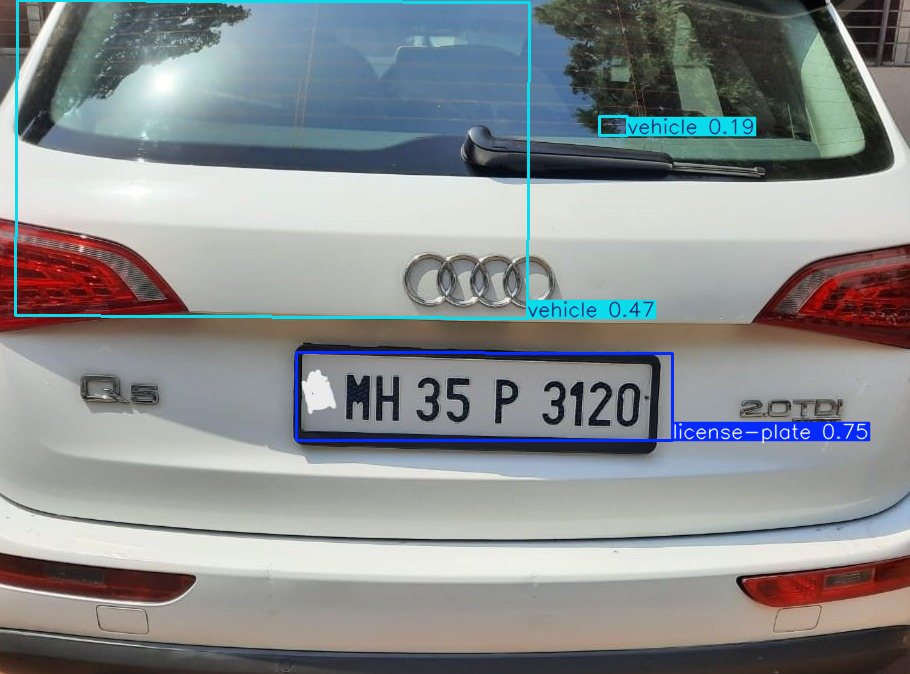


image 1/1 /content/test01.png: 640x640 13.4ms
Speed: 4.0ms preprocess, 13.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)


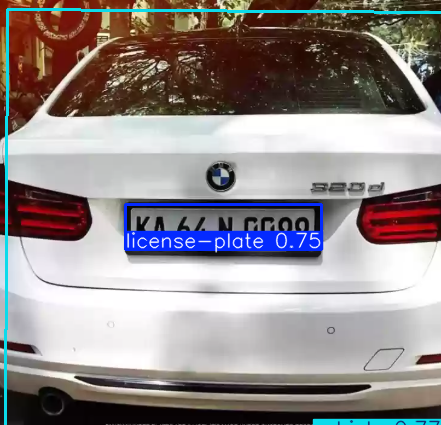

In [ ]:
test_images = ['/content/test.jpg', '/content/test01.png']

for img in test_images:
    results = model.predict(img, conf=0.15, iou=0.3)
    results[0].show()

##OBB boxes


image 1/1 /content/test.jpg: 480x640 194.2ms
Speed: 7.2ms preprocess, 194.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


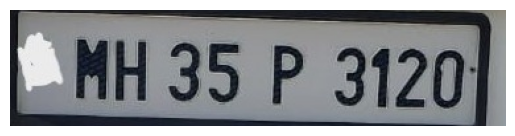

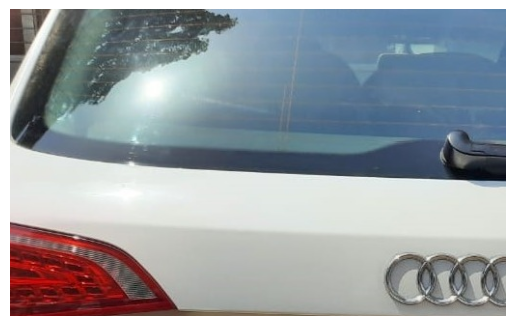

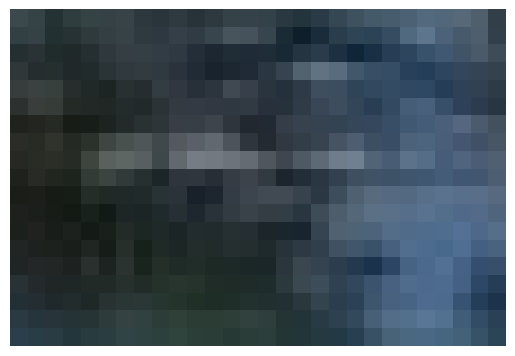


image 1/1 /content/test01.png: 640x640 253.6ms
Speed: 11.7ms preprocess, 253.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


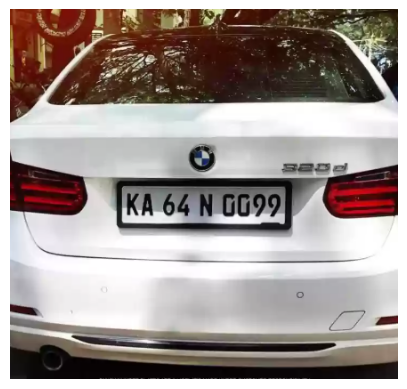

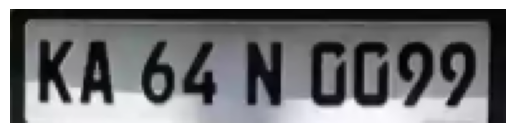

In [ ]:
import cv2
import matplotlib.pyplot as plt

for img in test_images:
    results = model.predict(img, conf=0.05, iou=0.2)

    # Read the original image
    orig_img = results[0].orig_img  # Extract original image

    # Check if OBB data exists
    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box in results[0].obb.xyxy:
            x_min, y_min, x_max, y_max = map(int, box.tolist())  # Convert to integers

            # Crop the license plate from the image
            cropped_plate = orig_img[y_min:y_max, x_min:x_max]

            # Display the cropped license plate
            plt.imshow(cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
            plt.axis("off")
            plt.show()
    else:
        print("No license plate detected in the image.")



image 1/1 /content/test.jpg: 480x640 608.5ms
Speed: 10.6ms preprocess, 608.5ms inference, 2.8ms postprocess per image at shape (1, 3, 480, 640)
Saved: cropped_plates/plate_0_0.jpg


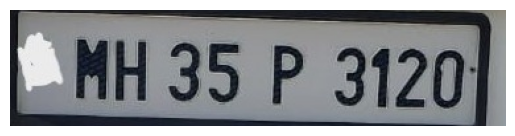

Saved: cropped_plates/plate_0_1.jpg


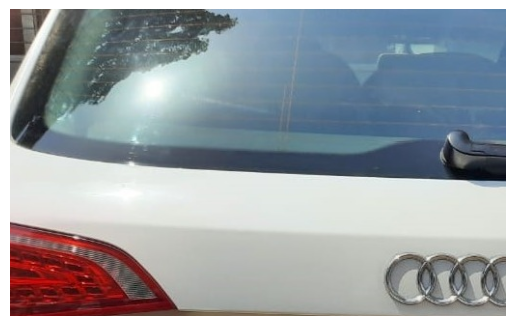

Saved: cropped_plates/plate_0_2.jpg


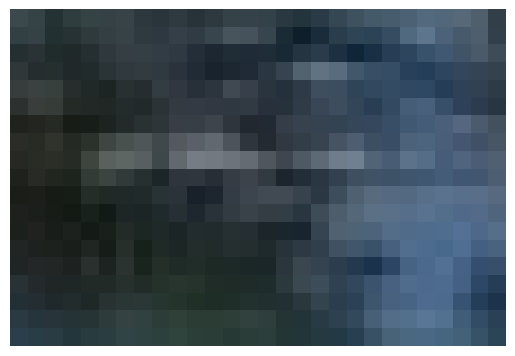


image 1/1 /content/test01.png: 640x640 443.7ms
Speed: 5.8ms preprocess, 443.7ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
Saved: cropped_plates/plate_1_0.jpg


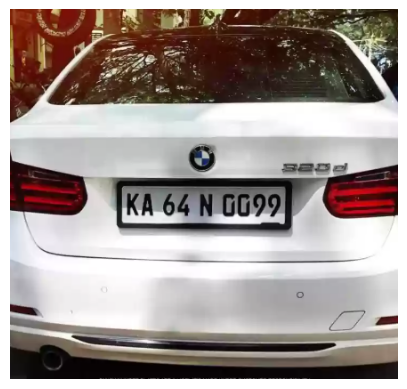

Saved: cropped_plates/plate_1_1.jpg


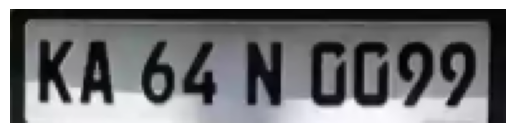

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

output_dir = "cropped_plates"
os.makedirs(output_dir, exist_ok=True)  # Create output directory if it doesn't exist

for idx, img in enumerate(test_images):
    results = model.predict(img, conf=0.05, iou=0.2)

    # Read the original image
    orig_img = results[0].orig_img  # Extract original image

    # Check if OBB data exists
    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, box in enumerate(results[0].obb.xyxy):
            x_min, y_min, x_max, y_max = map(int, box.tolist())  # Convert to integers

            # Crop the license plate from the image
            cropped_plate = orig_img[y_min:y_max, x_min:x_max]

            # Save the cropped plate image
            save_path = os.path.join(output_dir, f"plate_{idx}_{box_num}.jpg")
            cv2.imwrite(save_path, cropped_plate)
            print(f"Saved: {save_path}")

            # Display the cropped license plate
            plt.imshow(cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
            plt.axis("off")
            plt.show()
    else:
        print("No license plate detected in the image.")


##Cropped the image


image 1/1 /content/test.jpg: 480x640 295.6ms
Speed: 4.7ms preprocess, 295.6ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)
Saved: cropped_plates/plate_0.jpg


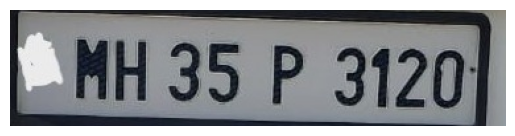


image 1/1 /content/test01.png: 640x640 891.6ms
Speed: 5.4ms preprocess, 891.6ms inference, 12.6ms postprocess per image at shape (1, 3, 640, 640)
Saved: cropped_plates/plate_1.jpg


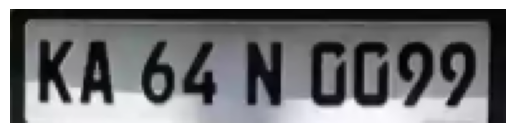

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

output_dir = "cropped_plates"
os.makedirs(output_dir, exist_ok=True)  # Create output directory if it doesn't exist

for idx, img in enumerate(test_images):
    results = model.predict(img, conf=0.05, iou=0.2)

    # Read the original image
    orig_img = results[0].orig_img  # Extract original image

    # Ensure the model returns labeled bounding boxes
    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            class_name = results[0].names[int(cls)]  # Get class label

            if class_name == "license-plate":  # Filter only license plate detections
                x_min, y_min, x_max, y_max = map(int, box.tolist())  # Convert to integers

                # Crop the license plate from the image
                cropped_plate = orig_img[y_min:y_max, x_min:x_max]

                # Save the cropped plate image
                save_path = os.path.join(output_dir, f"plate_{idx}.jpg")
                cv2.imwrite(save_path, cropped_plate)
                print(f"Saved: {save_path}")

                # Display the cropped license plate
                plt.imshow(cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB
                plt.axis("off")
                plt.show()
                break  # Stop after finding the first valid license plate
    else:
        print("No license plate detected in the image.")


In [5]:
!pip install paddlepaddle paddleocr


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.8/192.8 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 26.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.8/297.8 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 77.3 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=c4b8bc6e410c11c93342fb9677641769af2d3ef0bc8fbf960f02380ec449f66b
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24b609dfb8a89
Successfully built fire
  Attempting uninstall: opt_einsum
    Found e

##Applying Paddle OCR WIth multiple images

[2025/03/27 17:27:44] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

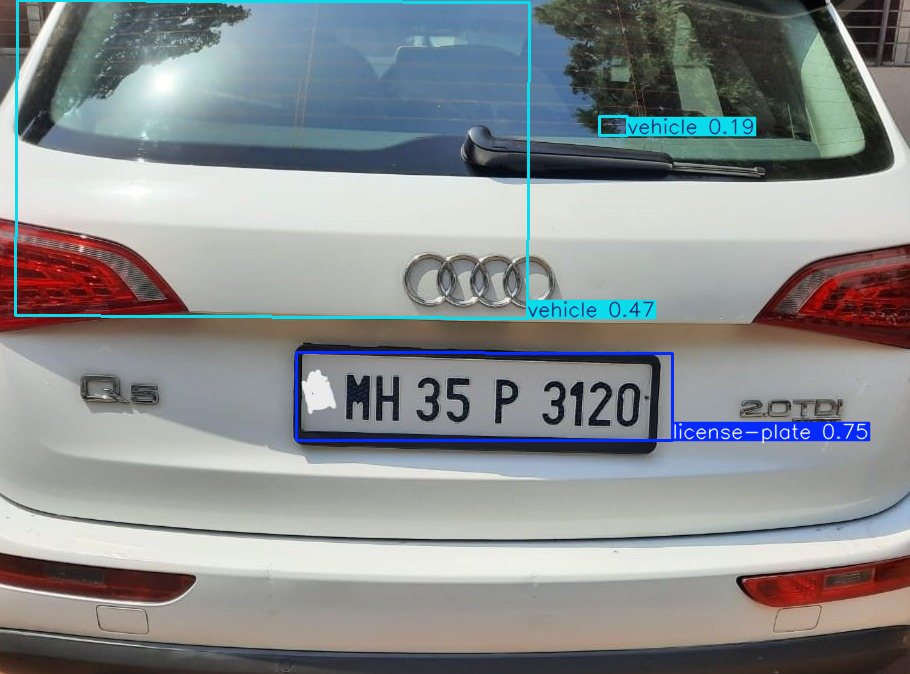

Saved: cropped_plates/plate_0.jpg
[2025/03/27 17:27:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.05859231948852539
[2025/03/27 17:27:47] ppocr DEBUG: cls num  : 1, elapsed : 0.03145647048950195
[2025/03/27 17:27:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12917256355285645
OCR Text Saved: plate_texts/plate_0.txt


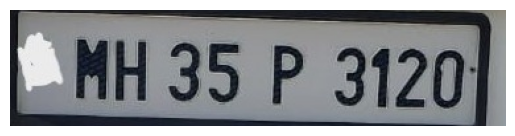


image 1/1 /content/test01.png: 640x640 248.3ms
Speed: 6.1ms preprocess, 248.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


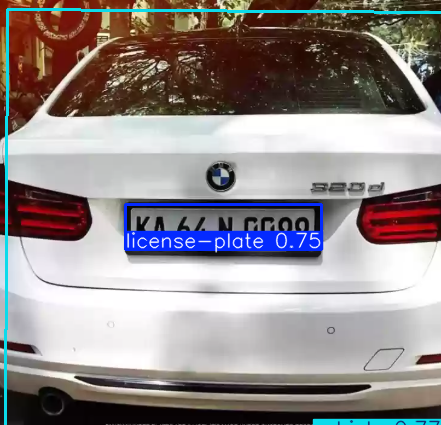

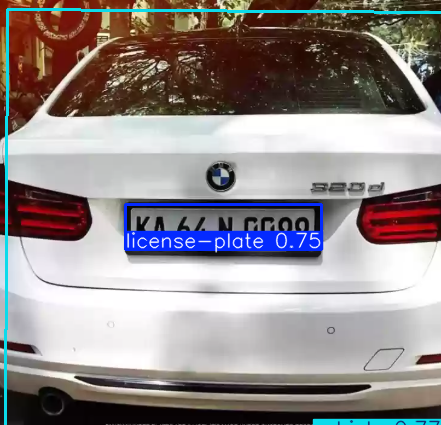

Saved: cropped_plates/plate_1.jpg
[2025/03/27 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03583788871765137
[2025/03/27 17:27:48] ppocr DEBUG: cls num  : 1, elapsed : 0.014606475830078125
[2025/03/27 17:27:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10060262680053711
OCR Text Saved: plate_texts/plate_1.txt


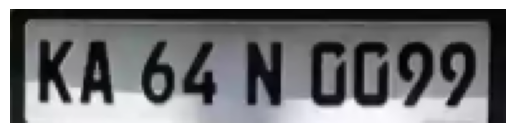


image 1/1 /content/test03.jpg: 384x640 173.1ms
Speed: 3.8ms preprocess, 173.1ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


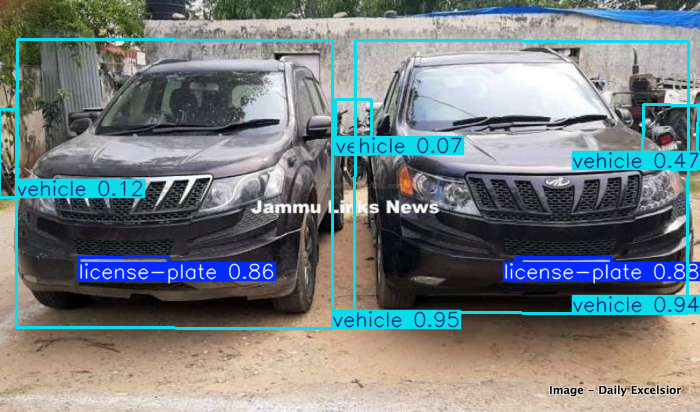

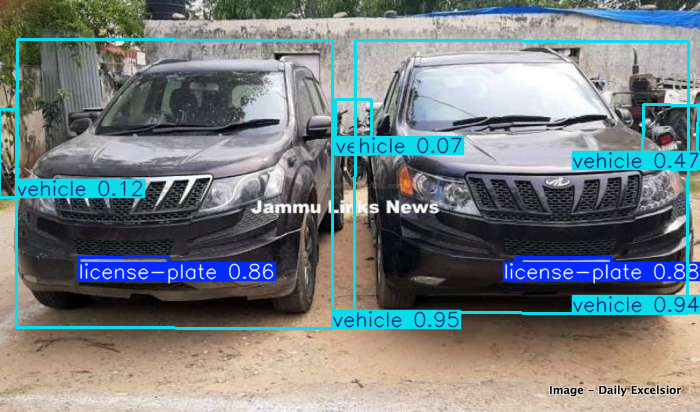

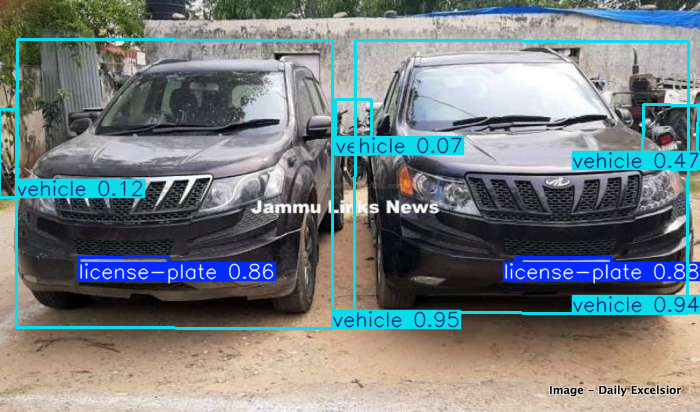

Saved: cropped_plates/plate_2.jpg
[2025/03/27 17:27:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02737116813659668
[2025/03/27 17:27:48] ppocr DEBUG: cls num  : 1, elapsed : 0.012909650802612305
[2025/03/27 17:27:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11042952537536621
OCR Text Saved: plate_texts/plate_2.txt


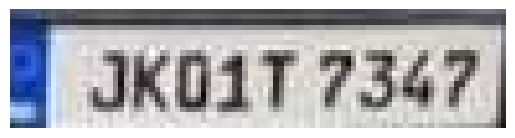

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
from paddleocr import PaddleOCR
test_images = ['/content/test.jpg', '/content/test01.png','/content/test03.jpg']

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")

output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)  # Create directory for cropped plates
os.makedirs(text_output_dir, exist_ok=True)  # Create directory for text files

for idx, img in enumerate(test_images):
    results = model.predict(img, conf=0.05, iou=0.2)

    # Read the original image
    orig_img = results[0].orig_img

    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            results[0].show()
            class_name = results[0].names[int(cls)]

            if class_name == "license-plate":
                x_min, y_min, x_max, y_max = map(int, box.tolist())

                # Crop the license plate
                cropped_plate = orig_img[y_min:y_max, x_min:x_max]

                # Save the cropped plate image
                save_path = os.path.join(output_dir, f"plate_{idx}.jpg")
                cv2.imwrite(save_path, cropped_plate)
                print(f"Saved: {save_path}")

                # OCR recognition
                ocr_result = ocr.ocr(cropped_plate, cls=True)
                extracted_text = ""
                for res in ocr_result:
                    for line in res:
                        extracted_text += line[1][0] + "\n"  # Extract text part

                # Save extracted text
                text_save_path = os.path.join(text_output_dir, f"plate_{idx}.txt")
                with open(text_save_path, "w") as text_file:
                    text_file.write(extracted_text)
                print(f"OCR Text Saved: {text_save_path}")

                # Display the cropped image
                plt.imshow(cv2.cvtColor(cropped_plate, cv2.COLOR_BGR2RGB))
                plt.axis("off")
                plt.show()

                break  # Stop after processing the first detected license plate
    else:
        print("No license plate detected in the image.")


##Perfect code for multiple cars in one photo with multiples photos

[2025/03/27 17:41:35] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

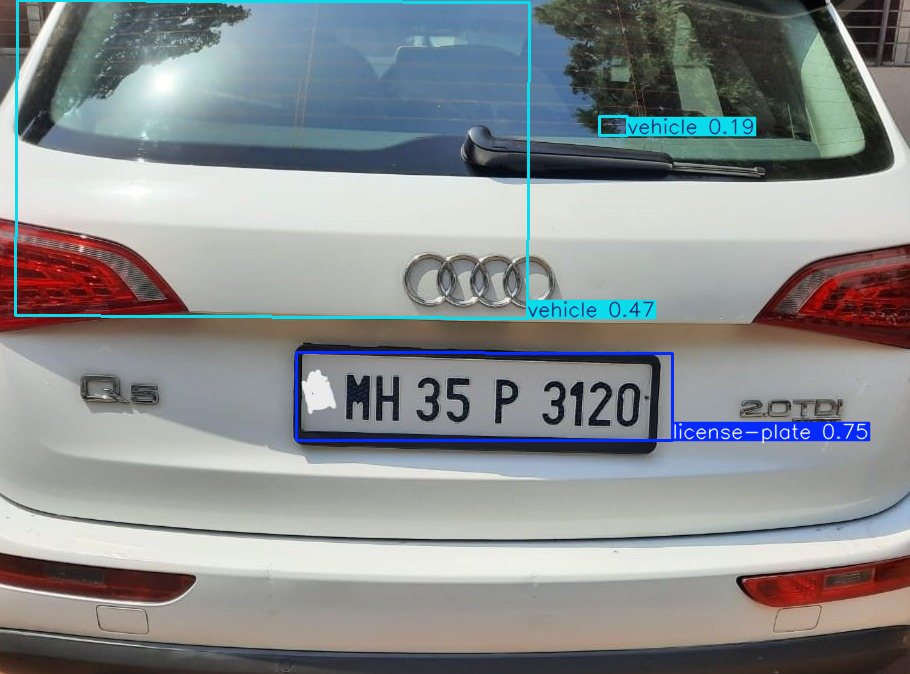

Saved: cropped_plates/plate_0_0.jpg
[2025/03/27 17:41:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.06841564178466797
[2025/03/27 17:41:39] ppocr DEBUG: cls num  : 1, elapsed : 0.031357765197753906
[2025/03/27 17:41:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1452188491821289
OCR Text Saved: plate_texts/plate_0.txt

image 1/1 /content/test01.png: 640x640 384.8ms
Speed: 9.7ms preprocess, 384.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


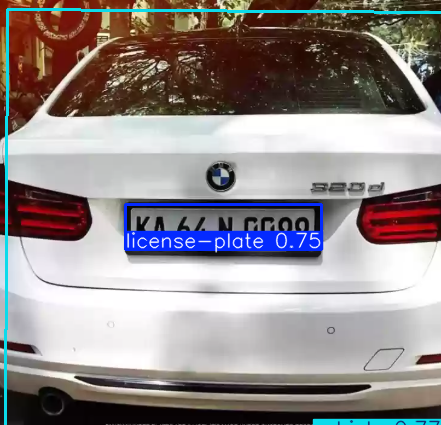

Saved: cropped_plates/plate_1_1.jpg
[2025/03/27 17:41:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04273343086242676
[2025/03/27 17:41:40] ppocr DEBUG: cls num  : 1, elapsed : 0.019325971603393555
[2025/03/27 17:41:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11951518058776855
OCR Text Saved: plate_texts/plate_1.txt

image 1/1 /content/test05.png: 544x640 248.3ms
Speed: 6.7ms preprocess, 248.3ms inference, 3.1ms postprocess per image at shape (1, 3, 544, 640)


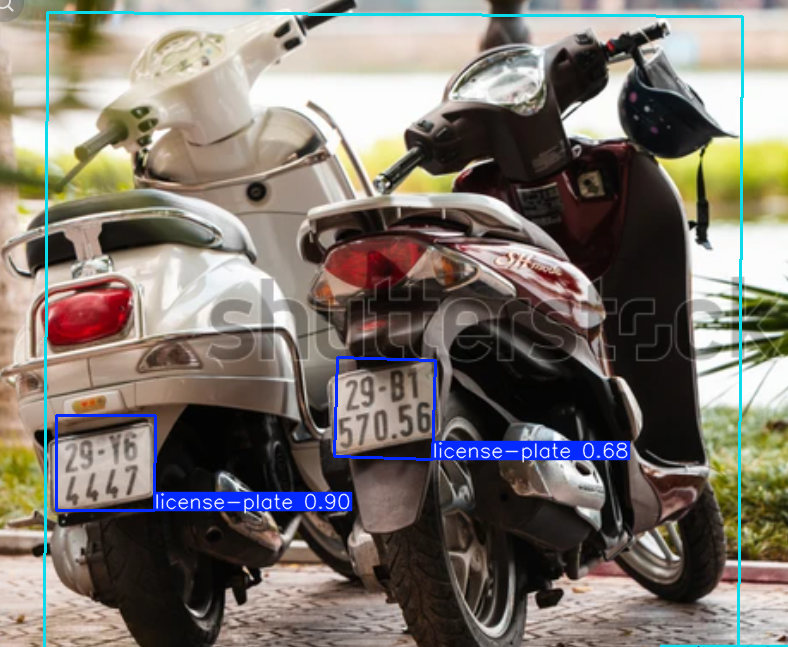

Saved: cropped_plates/plate_2_0.jpg
[2025/03/27 17:41:41] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.07145166397094727
[2025/03/27 17:41:41] ppocr DEBUG: cls num  : 2, elapsed : 0.051923513412475586
[2025/03/27 17:41:41] ppocr DEBUG: rec_res num  : 2, elapsed : 0.3738396167755127
Saved: cropped_plates/plate_2_2.jpg
[2025/03/27 17:41:41] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.03148818016052246
[2025/03/27 17:41:41] ppocr DEBUG: cls num  : 2, elapsed : 0.018702983856201172
[2025/03/27 17:41:41] ppocr DEBUG: rec_res num  : 2, elapsed : 0.16520977020263672
OCR Text Saved: plate_texts/plate_2.txt


In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
from paddleocr import PaddleOCR

test_images = ['/content/test.jpg', '/content/test01.png','/content/test05.png',]

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")

output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)  # Create directory for cropped plates
os.makedirs(text_output_dir, exist_ok=True)  # Create directory for text files

for idx, img in enumerate(test_images):
    results = model.predict(img, conf=0.05, iou=0.2)
    results[0].show()

    # Read the original image
    orig_img = results[0].orig_img

    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        # Create a list to store text from all detected license plates
        all_text = []

        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            class_name = results[0].names[int(cls)]

            if class_name == "license-plate":  # Filter only license plate detections
                x_min, y_min, x_max, y_max = map(int, box.tolist())

                # Crop the license plate
                cropped_plate = orig_img[y_min:y_max, x_min:x_max]

                # Save the cropped plate image
                save_path = os.path.join(output_dir, f"plate_{idx}_{box_num}.jpg")
                cv2.imwrite(save_path, cropped_plate)
                print(f"Saved: {save_path}")

                # OCR recognition
                ocr_result = ocr.ocr(cropped_plate, cls=True)
                extracted_text = ""
                for res in ocr_result:
                    for line in res:
                        extracted_text += line[1][0] + "\n"  # Extract text part

                # Add extracted text to the list
                all_text.append(extracted_text)

        # Save all extracted texts to one file for the current image
        if all_text:
            text_save_path = os.path.join(text_output_dir, f"plate_{idx}.txt")
            with open(text_save_path, "w") as text_file:
                text_file.write("\n".join(all_text))  # Save all texts in one file
            print(f"OCR Text Saved: {text_save_path}")

    else:
        print(f"No license plates detected in image {idx}.")


##Final Code

[2025/03/27 18:03:45] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_l

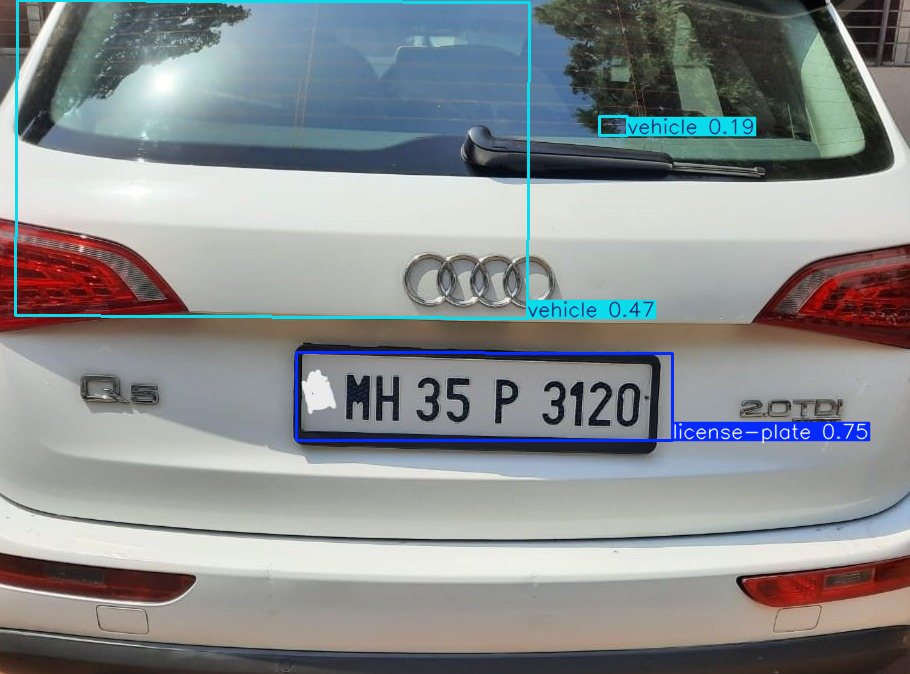

Saved: cropped_plates/plate.jpg
[2025/03/27 18:03:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.060764312744140625
[2025/03/27 18:03:48] ppocr DEBUG: cls num  : 1, elapsed : 0.029345989227294922
[2025/03/27 18:03:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.13184332847595215
OCR Text Saved: plate_texts/plate_text.txt


In [ ]:
import cv2
import os
from paddleocr import PaddleOCR

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")

# Define input image path
input_image = "./test.jpg"  # Change this to your image file

# Define output directories
output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(text_output_dir, exist_ok=True)

# Load the image
orig_img = cv2.imread(input_image)
if orig_img is None:
    print("Error: Could not load image.")
    exit()

# YOLO model prediction (replace 'model' with your trained YOLO model object)
results = model.predict(input_image, conf=0.05, iou=0.2)
results[0].show()

if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
    all_text = []
    for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
        class_name = results[0].names[int(cls)]
        if class_name == "license-plate":
            x_min, y_min, x_max, y_max = map(int, box.tolist())
            cropped_plate = orig_img[y_min:y_max, x_min:x_max]
            save_path = os.path.join(output_dir, "plate.jpg")
            cv2.imwrite(save_path, cropped_plate)
            print(f"Saved: {save_path}")

            # OCR recognition
            ocr_result = ocr.ocr(cropped_plate, cls=True)
            extracted_text = ""
            for res in ocr_result:
                for line in res:
                    extracted_text += line[1][0] + "\n"

            all_text.append(extracted_text)

    if all_text:
        text_save_path = os.path.join(text_output_dir, "plate_text.txt")
        with open(text_save_path, "w") as text_file:
            text_file.write("\n".join(all_text))
        print(f"OCR Text Saved: {text_save_path}")
else:
    print("No license plates detected.")


##Video Processing

In [8]:
import cv2
import os
from paddleocr import PaddleOCR
from ultralytics import YOLO

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")

# Define input video path
input_video = "/content/testv1.mp4"  # Change this to your video file

# Define output directories
output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(text_output_dir, exist_ok=True)

# Load YOLO model (Replace 'model' with your trained YOLO model object)
# model = YOLO("best.pt")  # Uncomment and modify based on your model

# Open the video file
cap = cv2.VideoCapture(input_video)
if not cap.isOpened():
    print("Error: Could not open video file.")
    exit()

frame_count = 0
saved_plates = set()  # Set to store unique plate numbers

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLO model prediction (replace 'model' with your trained YOLO model object)
    results = model.predict(frame, conf=0.05, iou=0.2)

    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            class_name = results[0].names[int(cls)]
            if class_name == "license-plate":
                x_min, y_min, x_max, y_max = map(int, box.tolist())
                cropped_plate = frame[y_min:y_max, x_min:x_max]

                # Check if cropped image is valid
                if cropped_plate.shape[0] == 0 or cropped_plate.shape[1] == 0:
                    continue  # Skip invalid crops

                # Resize small images to improve OCR accuracy
                if cropped_plate.shape[0] < 20 or cropped_plate.shape[1] < 80:
                    cropped_plate = cv2.resize(cropped_plate, (150, 50))

                # OCR recognition
                ocr_result = ocr.ocr(cropped_plate, cls=True)

                if ocr_result and isinstance(ocr_result, list) and any(ocr_result):
                    extracted_text = "\n".join(
                        line[1][0] for res in ocr_result if res for line in res if len(line) > 1
                    ).strip()

                    # Save only if plate number is not already stored
                    if extracted_text and extracted_text not in saved_plates:
                        saved_plates.add(extracted_text)

                        save_path = os.path.join(output_dir, f"frame{frame_count}_plate{box_num}.jpg")
                        cv2.imwrite(save_path, cropped_plate)
                        print(f"Saved: {save_path}")

                        text_save_path = os.path.join(text_output_dir, f"frame{frame_count}_plate{box_num}.txt")
                        with open(text_save_path, "w") as text_file:
                            text_file.write(extracted_text)
                        print(f"OCR Text Saved: {text_save_path}")
                    else:
                        print(f"Duplicate plate detected: {extracted_text}, not saving again.")

cap.release()
cv2.destroyAllWindows()
print("Processing complete.")


Streaming output truncated to the last 5000 lines.
Speed: 2.4ms preprocess, 12.0ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12.1ms
Speed: 2.4ms preprocess, 12.1ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15.3ms
Speed: 2.7ms preprocess, 15.3ms inference, 4.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15.1ms
Speed: 2.4ms preprocess, 15.1ms inference, 4.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13.4ms
Speed: 2.3ms preprocess, 13.4ms inference, 3.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14.4ms
Speed: 2.7ms preprocess, 14.4ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18.9ms
Speed: 3.0ms preprocess, 18.9ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11.3ms
Speed: 2.2ms preproce

##Final code of video

In [10]:
import cv2
import os
from paddleocr import PaddleOCR
from ultralytics import YOLO

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")

# Define input video path
input_video = "/content/test_v3.mp4"  # Change this to your video file

# Define output directories
output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(text_output_dir, exist_ok=True)

# Load YOLO model (Replace 'model' with your trained YOLO model object)
# model = YOLO("best.pt")  # Uncomment and modify based on your model

# Open the video file
cap = cv2.VideoCapture(input_video)
if not cap.isOpened():
    print("Error: Could not open video file.")
    exit()

# Define output video settings
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_video_path = "output_with_bboxes.mp4"
out = cv2.VideoWriter(output_video_path, fourcc, cap.get(cv2.CAP_PROP_FPS), (frame_width, frame_height))

frame_count = 0
saved_plates = set()  # Set to store unique plate numbers

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    # YOLO model prediction (replace 'model' with your trained YOLO model object)
    results = model.predict(frame, conf=0.05, iou=0.2)

    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            class_name = results[0].names[int(cls)]
            if class_name == "license-plate":
                x_min, y_min, x_max, y_max = map(int, box.tolist())
                cropped_plate = frame[y_min:y_max, x_min:x_max]

                # Check if cropped image is valid
                if cropped_plate.shape[0] == 0 or cropped_plate.shape[1] == 0:
                    continue  # Skip invalid crops

                # Resize small images to improve OCR accuracy
                if cropped_plate.shape[0] < 20 or cropped_plate.shape[1] < 80:
                    cropped_plate = cv2.resize(cropped_plate, (150, 50))

                # OCR recognition
                ocr_result = ocr.ocr(cropped_plate, cls=True)

                if ocr_result and isinstance(ocr_result, list) and any(ocr_result):
                    extracted_text = "\n".join(
                        line[1][0] for res in ocr_result if res for line in res if len(line) > 1
                    ).strip()

                    # Save only if plate number is not already stored
                    if extracted_text and extracted_text not in saved_plates:
                        saved_plates.add(extracted_text)

                        save_path = os.path.join(output_dir, f"frame{frame_count}_plate{box_num}.jpg")
                        cv2.imwrite(save_path, cropped_plate)
                        print(f"Saved: {save_path}")

                        text_save_path = os.path.join(text_output_dir, f"frame{frame_count}_plate{box_num}.txt")
                        with open(text_save_path, "w") as text_file:
                            text_file.write(extracted_text)
                        print(f"OCR Text Saved: {text_save_path}")
                    else:
                        print(f"Duplicate plate detected: {extracted_text}, not saving again.")

                    # Draw bounding box and label on the frame
                    cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
                    cv2.putText(frame, extracted_text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Write the frame to output video
    out.write(frame)

cap.release()
out.release()
cv2.destroyAllWindows()
print("Processing complete. Output video saved as output_with_bboxes.mp4")


Streaming output truncated to the last 5000 lines.
[2025/03/28 09:48:50] ppocr DEBUG: rec_res num  : 0, elapsed : 1.430511474609375e-06
[2025/03/28 09:48:50] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.017802953720092773
[2025/03/28 09:48:50] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/03/28 09:48:50] ppocr DEBUG: rec_res num  : 0, elapsed : 1.430511474609375e-06

0: 384x640 49.0ms
Speed: 5.2ms preprocess, 49.0ms inference, 3.9ms postprocess per image at shape (1, 3, 384, 640)
[2025/03/28 09:48:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03020477294921875
[2025/03/28 09:48:50] ppocr DEBUG: cls num  : 1, elapsed : 0.025278806686401367
[2025/03/28 09:48:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06935787200927734
Saved: cropped_plates/frame232_plate0.jpg
OCR Text Saved: plate_texts/frame232_plate0.txt
[2025/03/28 09:48:50] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.01781177520751953
[2025/03/28 09:48:50] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/03/28 09:48:50] ppocr DEBUG: rec

##Backend code


In [1]:
import cv2
import os
from paddleocr import PaddleOCR
from ultralytics import YOLO

# Initialize PaddleOCR model
ocr = PaddleOCR(use_angle_cls=True, lang="en")
model = YOLO('/content/drive/MyDrive/Yolo_OBB_Model/license_plate_obb/weights/best.pt')
# Define input path (can be image or video)
input_path = "/content/test_v3.mp4"  # Change this to your file

# Define output directories
output_dir = "cropped_plates"
text_output_dir = "plate_texts"
os.makedirs(output_dir, exist_ok=True)
os.makedirs(text_output_dir, exist_ok=True)

# Load YOLO model (Replace 'model' with your trained YOLO model object)
# model = YOLO("best.pt")  # Uncomment and modify based on your model

saved_plates = set()  # Set to store unique plate numbers

def process_frame(frame, frame_count):
    """Process a single frame to detect and extract license plates."""
    results = model.predict(frame, conf=0.05, iou=0.2)
    if hasattr(results[0], 'obb') and results[0].obb is not None and len(results[0].obb.xyxy) > 0:
        for box_num, (box, cls) in enumerate(zip(results[0].obb.xyxy, results[0].obb.cls)):
            class_name = results[0].names[int(cls)]
            if class_name == "license-plate":
                x_min, y_min, x_max, y_max = map(int, box.tolist())
                cropped_plate = frame[y_min:y_max, x_min:x_max]

                if cropped_plate.shape[0] == 0 or cropped_plate.shape[1] == 0:
                    continue  # Skip invalid crops

                if cropped_plate.shape[0] < 20 or cropped_plate.shape[1] < 80:
                    cropped_plate = cv2.resize(cropped_plate, (150, 50))

                ocr_result = ocr.ocr(cropped_plate, cls=True)

                if ocr_result and isinstance(ocr_result, list) and any(ocr_result):
                    extracted_text = "\n".join(
                        line[1][0] for res in ocr_result if res for line in res if len(line) > 1
                    ).strip()

                    if extracted_text and extracted_text not in saved_plates:
                        saved_plates.add(extracted_text)
                        save_path = os.path.join(output_dir, f"frame{frame_count}_plate{box_num}.jpg")
                        cv2.imwrite(save_path, cropped_plate)
                        print(f"Saved: {save_path}")

                        text_save_path = os.path.join(text_output_dir, f"frame{frame_count}_plate{box_num}.txt")
                        with open(text_save_path, "w") as text_file:
                            text_file.write(extracted_text)
                        print(f"OCR Text Saved: {text_save_path}")
                    else:
                        print(f"Duplicate plate detected: {extracted_text}, not saving again.")

                    cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
                    cv2.putText(frame, extracted_text, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
    return frame

if input_path.lower().endswith(('.png', '.jpg', '.jpeg')):
    # Process as image
    frame = cv2.imread(input_path)
    if frame is None:
        print("Error: Could not open image file.")
    else:
        processed_frame = process_frame(frame, frame_count=1)
        output_image_path = "output_with_bboxes.jpg"
        cv2.imwrite(output_image_path, processed_frame)
        print(f"Processing complete. Output image saved as {output_image_path}")
else:
    # Process as video
    cap = cv2.VideoCapture(input_path)
    if not cap.isOpened():
        print("Error: Could not open video file.")
        exit()

    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    output_video_path = "output_with_bboxes.mp4"
    out = cv2.VideoWriter(output_video_path, fourcc, cap.get(cv2.CAP_PROP_FPS), (frame_width, frame_height))

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1
        processed_frame = process_frame(frame, frame_count)
        out.write(processed_frame)

    cap.release()
    out.release()
    print(f"Processing complete. Output video saved as {output_video_path}")

cv2.destroyAllWindows()


/usr/local/lib/python3.11/dist-packages/paddle/utils/cpp_extension/extension_utils.py:711: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


Streaming output truncated to the last 5000 lines.
[2025/03/28 19:15:32] ppocr DEBUG: rec_res num  : 0, elapsed : 1.6689300537109375e-06
[2025/03/28 19:15:32] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.022983789443969727
[2025/03/28 19:15:32] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/03/28 19:15:32] ppocr DEBUG: rec_res num  : 0, elapsed : 1.430511474609375e-06

0: 384x640 197.8ms
Speed: 4.4ms preprocess, 197.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
[2025/03/28 19:15:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01891493797302246
[2025/03/28 19:15:32] ppocr DEBUG: cls num  : 1, elapsed : 0.024780988693237305
[2025/03/28 19:15:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07248473167419434
Saved: cropped_plates/frame232_plate0.jpg
OCR Text Saved: plate_texts/frame232_plate0.txt
[2025/03/28 19:15:32] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.021085262298583984
[2025/03/28 19:15:32] ppocr DEBUG: cls num  : 0, elapsed : 0
[2025/03/28 19:15:32] ppocr DEBUG:

In [3]:
!cp -r /content/cropped_plates /content/drive/MyDrive/cropped_plates

In [4]:
!cp -r /content/plate_texts /content/drive/MyDrive/plain